In [60]:
from tensorflow_core.python import keras

In [113]:

from tensorflow_core.python.keras import backend as K
from tensorflow_core.python.keras.layers.core import Dense, Activation
from tensorflow_core.python.keras.optimizers import Adam
from tensorflow_core.python.keras.metrics import categorical_crossentropy
from tensorflow_core.python.keras.preprocessing import image
from tensorflow_core.python.keras.models import Model
from tensorflow_core.python.keras.applications import imagenet_utils
from tensorflow_core.python.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow_core.python.keras.applications import MobileNet
from tensorflow_core.python.keras.applications.mobilenet import preprocess_input
import numpy as np
from IPython.display import Image
from tensorflow_core.python.keras.optimizers import Adam

# Load pre trained mobilenet model

Mobilenet model is computer vision model suitable for mobile and embedded applications due to their low computing power

In [114]:
mobile = keras.applications.mobilenet.MobileNet()

In [77]:
# method to prepare image for prediction
def process_image(file):
    img_path = ''
    img = image.load_img(img_path + file, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array_expanded_dims = np.expand_dims(img_array, axis=0)
    return keras.applications.mobilenet.preprocess_input(img_array_expanded_dims)

TEST MODEL ACCURACY ON AIREDALE DOG, Accuracy 82%

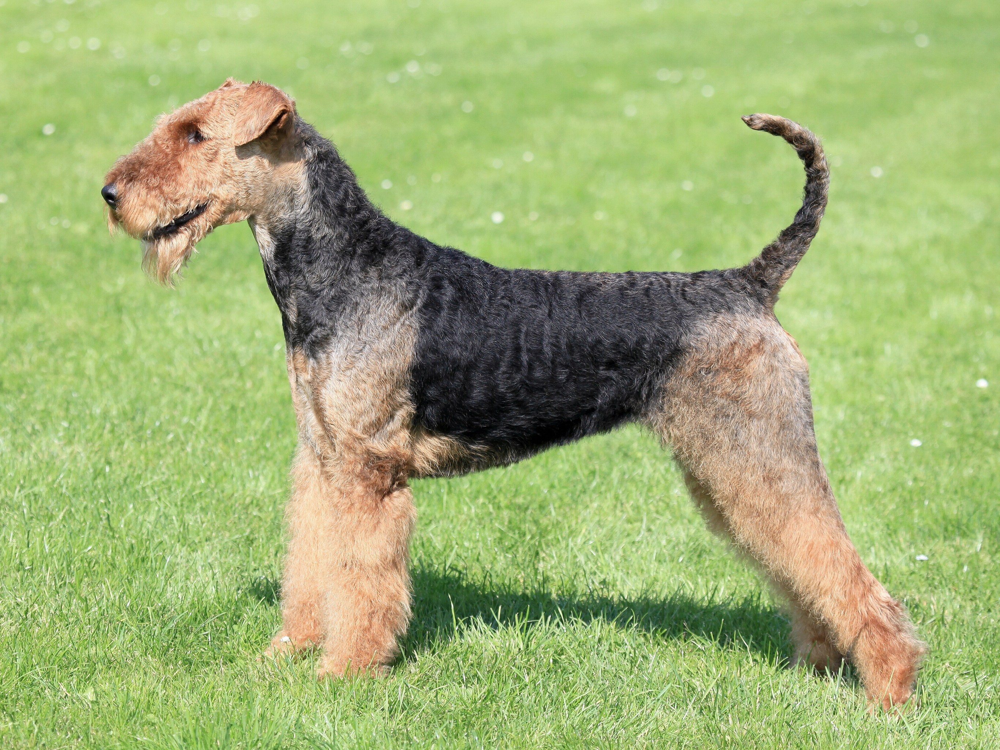

In [65]:
Image(filename='./pictures/airedaleterier.jpg')

In [78]:
image = process_image('./pictures/airedaleterier.jpg')
prediction = mobile.predict(image)
result = imagenet_utils.decode_predictions(prediction)
result

[[('n02096051', 'Airedale', 0.82893455),
  ('n02095570', 'Lakeland_terrier', 0.15198815),
  ('n02095314', 'wire-haired_fox_terrier', 0.018859813),
  ('n02091635', 'otterhound', 0.00013363679),
  ('n02093754', 'Border_terrier', 3.1574473e-05)]]

TEST ON ANOTHER DOG BREED , Accuracy 99%

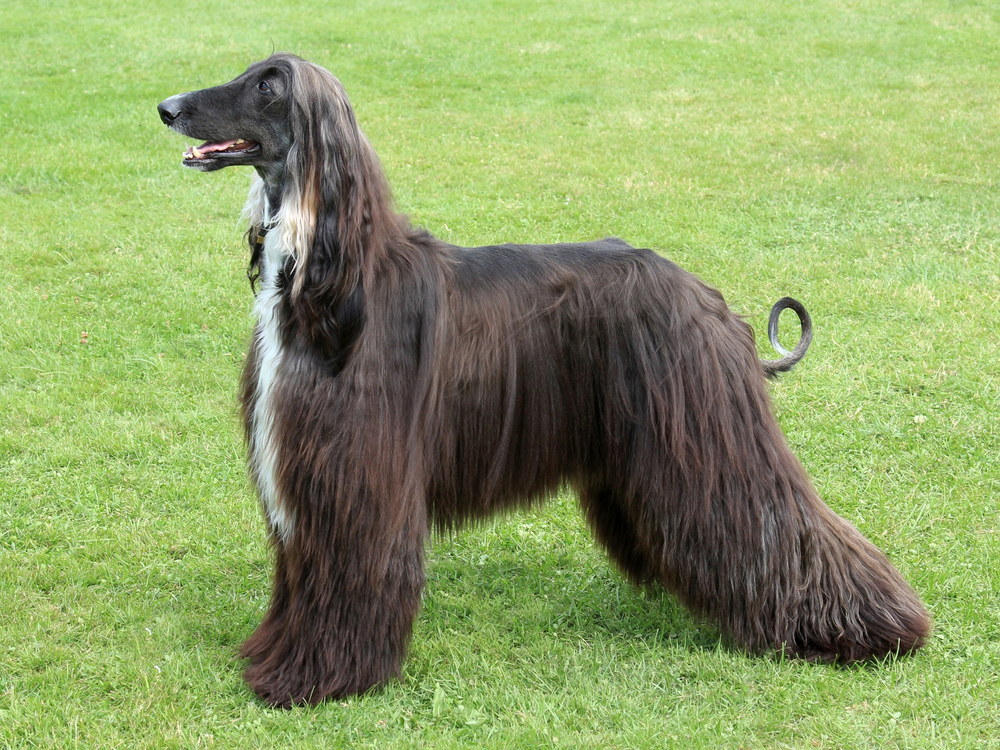

In [83]:
Image(filename='./pictures/Afaghan_Hound.jpg')

In [86]:
image = process_image('./pictures/Afaghan_Hound.jpg')
prediction = mobile.predict(image)
result = imagenet_utils.decode_predictions(prediction)
result

[[('n02088094', 'Afghan_hound', 0.999361),
  ('n02102973', 'Irish_water_spaniel', 0.00026467236),
  ('n02113799', 'standard_poodle', 0.0002115074),
  ('n02091831', 'Saluki', 4.3242806e-05),
  ('n02105505', 'komondor', 2.6875432e-05)]]

TEST MODEL ON HEN, 87% Accuracy

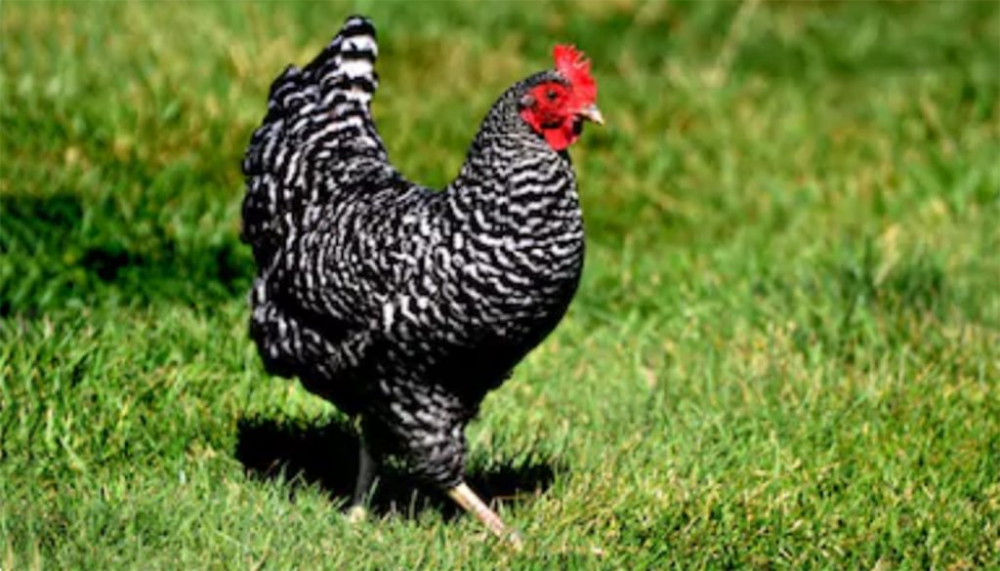

In [24]:
Image(filename='./pictures/Plymouth Rock chicken.jpg')

In [94]:
image = process_image('./pictures/Plymouth Rock chicken.jpg')
prediction = mobile.predict(image)
result = imagenet_utils.decode_predictions(prediction)
result

[[('n01514859', 'hen', 0.8748291),
  ('n01514668', 'cock', 0.0978195),
  ('n01798484', 'prairie_chicken', 0.012433128),
  ('n01807496', 'partridge', 0.0084966915),
  ('n01795545', 'black_grouse', 0.0046589295)]]

CAT PREDICTED WITH 91%

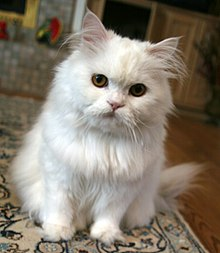

In [27]:
Image(filename='./pictures/Persian cat.jpg')

In [96]:
image = process_image('./pictures/Persian cat.jpg')
prediction = mobile.predict(image)
result = imagenet_utils.decode_predictions(prediction)
result

[[('n02123394', 'Persian_cat', 0.917022),
  ('n02328150', 'Angora', 0.06563903),
  ('n02086079', 'Pekinese', 0.0023119925),
  ('n02085782', 'Japanese_spaniel', 0.0019686085),
  ('n02127052', 'lynx', 0.0018558824)]]

BENGAL  CAT PREDICTED AS EGYPT CAT

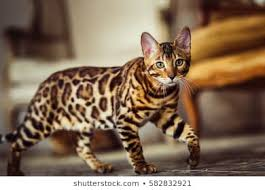

In [29]:
Image(filename='./pictures/Bengal.jpg')

In [103]:
image = process_image('./pictures/Bengal.jpg')
prediction = mobile.predict(image)
result = imagenet_utils.decode_predictions(prediction)
result

[[('n02124075', 'Egyptian_cat', 0.58533514),
  ('n02128925', 'jaguar', 0.16988522),
  ('n02123159', 'tiger_cat', 0.14826587),
  ('n02123045', 'tabby', 0.040793687),
  ('n02129604', 'tiger', 0.022517888)]]

# TRANSFER LEARNING

Manipulate Mobilenet model top layers and employ transfer learning. To do this we train the model on new images of cattle breeds

We use a library by hardikvasa used to search and download google images https://github.com/hardikvasa/google-images-download
Updated by Joe Clinton https://github.com/Joeclinton1/google-images-download

In [81]:
#pip install google_images_download

In [104]:
from google_images_download import google_images_download

In [105]:
response = google_images_download.googleimagesdownload()

Download images of 3 cattle breeds. Fresian, Boran and Guernsey

In [106]:
arguments = {"keywords":"Fresian cattle,Boran cattle,guernsey cattle","limit":15,"print_urls":True}

In [107]:
paths = response.download(arguments)


Item no.: 1 --> Item name = guernsey cattle
Evaluating...
Starting Download...
Image URL: https://domesticanimalbreeds.com/wp-content/uploads/2019/01/Guernsey-Cattle-1024x586.jpg
Completed Image ====> 1.Guernsey-Cattle-1024x586.jpg
Image URL: https://cdn.britannica.com/20/520-050-A5A47504/Guernsey-cow.jpg
Completed Image ====> 2.Guernsey-cow.jpg
Image URL: https://upload.wikimedia.org/wikipedia/commons/5/56/Guernsey_July_2011_212.jpg
Completed Image ====> 3.Guernsey_July_2011_212.jpg
Image URL: https://www.thecattlesite.com/breeds/contents/Guernsey%20cow.jpg
Completed Image ====> 4.Guernsey%20cow.jpg
Image URL: https://lookaside.fbsbx.com/lookaside/crawler/media/?media_id=989573601097390
Invalid or missing image format. Skipping...
Image URL: https://livestockconservancy.org/images/uploads/abstracts/guernsey.jpg
Completed Image ====> 5.guernsey.jpg
Image URL: https://189662-567937-2-raikfcquaxqncofqfm.stackpathdns.com/wp-content/uploads/2018/12/Guernsey-Cattle..jpg
Completed Image ===

In [111]:
base_model=MobileNet(weights='imagenet',include_top=False) #import the mobilenet model, add top layers and retrain.

new_model =base_model.output
new_model =GlobalAveragePooling2D()(new_model)
#Add 3 dense layers
new_model =Dense(1024,activation='relu')(new_model)
new_model=Dense(1024,activation='relu')(new_model) 
new_model=Dense(512,activation='relu')(new_model) 
# Final classification layer with 3 classes 
predictions=Dense(3,activation='softmax')(new_model) 

In [115]:
model=Model(inputs=base_model.input,outputs=predictions)

Print model structure

In [116]:
print(model.summary())

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128 

We shall use the pretrained weights from the Imagenet dataset. 

In [117]:
for layer in model.layers:
    layer.trainable=False
# or if we want to set the first 20 layers of the network to be non-trainable
for layer in model.layers[:20]:
    layer.trainable=False
for layer in model.layers[20:]:
    layer.trainable=True

In [118]:
from tensorflow_core.keras.preprocessing.image import ImageDataGenerator

In [119]:
# Load our new training data  into the image generator
train_datagen=ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator=train_datagen.flow_from_directory('./downloads',
                                                 target_size=(224,224),
                                                 color_mode='rgb',
                                                 batch_size=32,
                                                 class_mode='categorical',
                                                 shuffle=True)

Found 39 images belonging to 3 classes.


In [120]:
# Train the model using Adam optmimizer and categorical crossentropy
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

step_size_train=train_generator.n//train_generator.batch_size
model.fit_generator(generator=train_generator,steps_per_epoch=step_size_train,epochs=10)

Epoch 1/10
1/1 [==============================] - 3s 3s/step - loss: 1.0992 - accuracy: 0.4286
Epoch 2/10
1/1 [==============================] - 10s 10s/step - loss: 1.7361 - accuracy: 0.5625
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 2.9692 - accuracy: 0.7143
Epoch 4/10
1/1 [==============================] - 11s 11s/step - loss: 2.3412 - accuracy: 0.6250
Epoch 5/10
1/1 [==============================] - 11s 11s/step - loss: 0.0917 - accuracy: 1.0000
Epoch 6/10
1/1 [==============================] - 3s 3s/step - loss: 0.6508 - accuracy: 0.7143
Epoch 7/10
1/1 [==============================] - 10s 10s/step - loss: 0.3390 - accuracy: 0.8438
Epoch 8/10
1/1 [==============================] - 2s 2s/step - loss: 0.2309 - accuracy: 0.8571
Epoch 9/10
1/1 [==============================] - 2s 2s/step - loss: 0.2938 - accuracy: 0.8571
Epoch 10/10
1/1 [==============================] - 11s 11s/step - loss: 0.0019 - accuracy: 1.0000


Model is now trained. Test the model on new input images

In [121]:
#prepare image before validation
def process_image(img_path, show=False):

    img = image.load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img)                    
    img_tensor = np.expand_dims(img_tensor, axis=0)         
    img_tensor /= 255.                                      

    if show:
        plt.imshow(img_tensor[0])                           
        plt.axis('off')
        plt.show()

    return img_tensor

Try the model on a new picture of Boran cattle and its predicted with 99% accuracy

In [122]:
img_path = './pictures/Boran.jpg'
new_image = load_image(img_path)

In [123]:
pred = model.predict(new_image)
pred

array([[9.9972159e-01, 2.6501366e-04, 1.3393446e-05]], dtype=float32)